In [1]:
import numpy as np
import scanpy.api as sc
import plotly
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

init_notebook_mode()
sc.settings.set_figure_params(dpi=80, color_map='OrRd')

/Users/kp9/anaconda3/envs/orig/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


This notebook will be a quick demonstration of the information stored within the AnnData objects created during an integrative study of several large-scale murine atlases. We provide both the cell space (Figure 4) and the resulting transcription factor network (Figure 5) for exploration. You need SCANPY installed to import and use the objects, and plotly for the interactive transcription factor network plot.

The objects can be downloaded from [ftp://ngs.sanger.ac.uk/production/teichmann/BBKNN/MouseAtlas.zip](ftp://ngs.sanger.ac.uk/production/teichmann/BBKNN/MouseAtlas.zip)

If you get an `IOPub data rate exceeded` error and you wish to use the interactive explorative plots of the transcription factor network, terminate the Jupyter Notebook and call it in this manner: `jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000`

# Cell space (Figure 4)

Import the data.

In [2]:
adata_cells = sc.read('MouseAtlas.subset.h5ad')

Let's take a look at what's within the object, in terms of per-cell/per-gene annotations. The `obs` fields are what's available for each cell, while `var` fields are what's available for each gene.

In [3]:
adata_cells

AnnData object with n_obs × n_vars = 114600 × 2797 
    obs: 'Organ', 'n_genes', 'n_counts', 'sample', 'louvain', 'summary2', 'batch', 'organ_sample', 'cnk', 'smp_org', 'chk', 'summary1', 'Organ groups', 'organ groups', 'cell types', 'Dataset', 'Cell types', 'Hox_genes'
    var: 'GeneName', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Cell types_colors', 'Dataset_colors', 'Organ groups_colors', 'cell types_colors', 'idx', 'louvain', 'louvain_colors', 'neighbors', 'organ groups_colors', 'pca', 'rank_genes_groups', 'sample_color', 'sample_colors', 'summary1_colors', 'summary2_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

The most useful manner of exploring this is via UMAP visualisations, matching the shape shown in Figure 4. Let's take a look at the complete organ annotation, sourced from the original murine atlases.

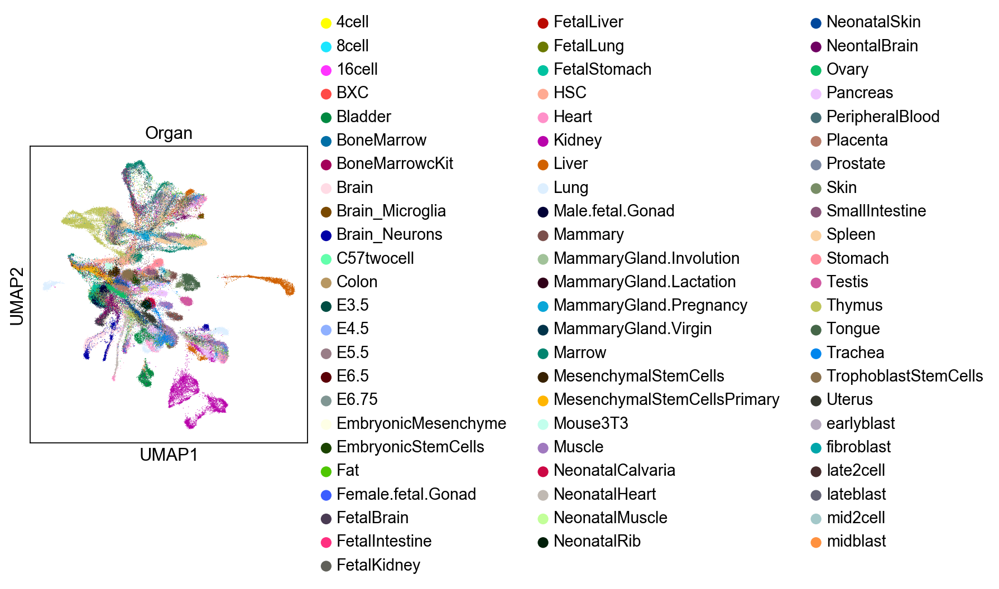

In [4]:
sc.pl.umap(adata_cells,color='Organ')

This was manually curated into a coarser organ annotation, stored in the `'organ groups'` field.

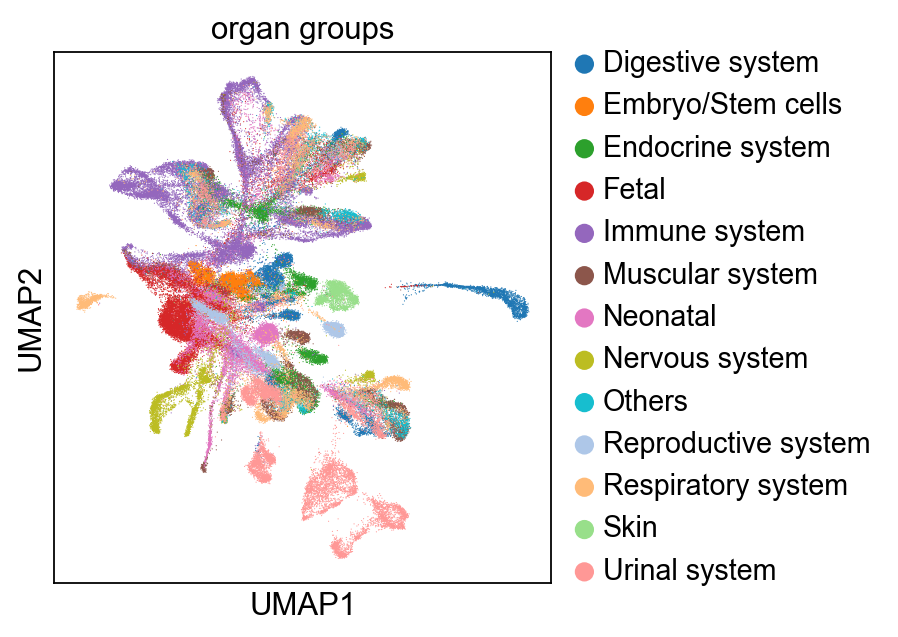

In [5]:
sc.pl.umap(adata_cells,color='organ groups')

We also proposed cell types based on manual curation (known marker genes and information from provided annotations for some of the atlases), and store them in the `'cell types'` field.

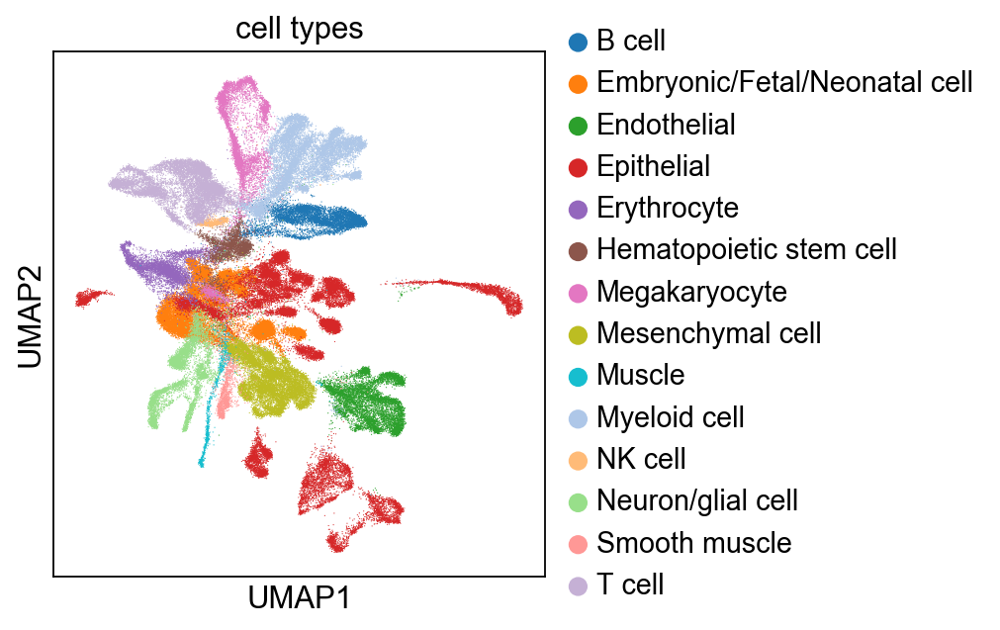

In [6]:
sc.pl.umap(adata_cells,color='cell types')

Likely of the most relevance to you, you can also plot gene expression in this space. This is likely where most of the exploring will happen. You can plot multiple genes by providing them as a list (i.e. surrounding multiple gene names with `[]`, like below).

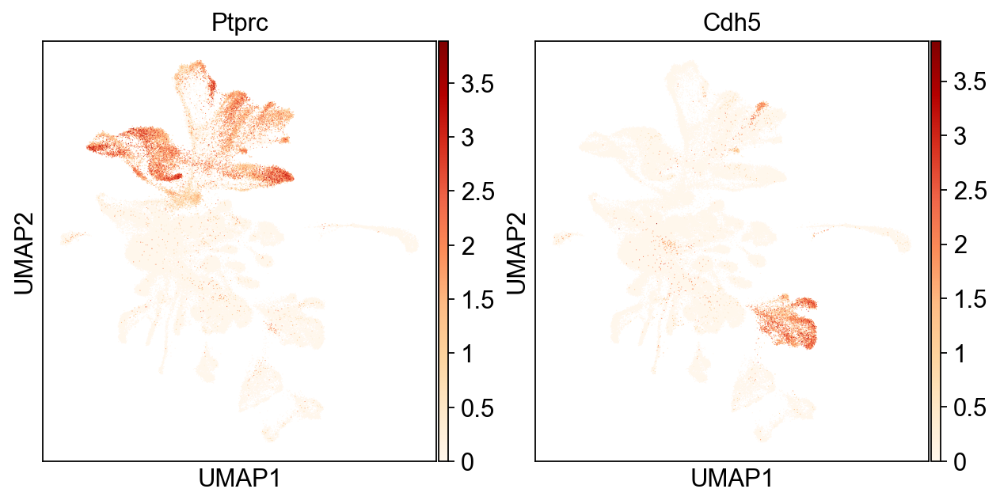

In [7]:
sc.pl.umap(adata_cells,color=['Ptprc','Cdh5'])

# Transcription factor network (Figure 5)

Here's a helper function that will create an interactive plot that will assist in exploring the data, and a second helper function that finds the top correlated genes with a TF of interest.

In [8]:
def draw_corr_anno(tfdata, annotation):
    x = tfdata.obsm["X_umap"][:,0]
    y = tfdata.obsm["X_umap"][:,1]
    c = tfdata.obs[annotation]
    n = list(tfdata.obs_names)
    pairs = tfdata.uns['graph_lines']
    
    linelist = []
    
    for p1, p2 in zip(pairs[0],pairs[1]):
        line = {
            'type': 'line',
            'x0': x[p1],
            'y0': y[p1],
            'x1': x[p2],
            'y1': y[p2],
            'layer': 'below',
            'opacity': 0.5,
            'line': {
                'color': 'gray',
                'width': 1,
                    },
            }
        linelist.append(line)
    
    
    layout = {
    'title' : annotation,
    'hovermode':'closest',
    'width' : 500,
    'height': 500,
    'shapes': linelist,
    'xaxis' : dict(
        autorange=True,
        showgrid=False,
        zeroline=False,
        showline=False,
        ticks='',
        showticklabels=False),
    'yaxis' : dict(
        autorange=True,
        showgrid=False,
        zeroline=False,
        showline=False,
        ticks='',
        showticklabels=False),
    }
    
    trace = go.Scatter(
        x = x,
        y = y,
        text = n,
        mode = 'markers',
        marker = dict(
            color = c,
            colorscale='RdBu',
            showscale=True))
    
    fig = fig = {'layout': layout,
                 'data': [trace],
                }

    iplot(fig)

def show_tf_module(tf, adata_cells, adata_tfs, N=10):
    C = adata_tfs.obsm['TF_gene_corr']
    tf_list = adata_tfs.uns['TF_gene_corr_tf_list']
    gene_list = adata_tfs.uns['TF_gene_corr_gene_list']

    tf_idx = tf_list == tf
    C_tf = C[tf_idx]

    module = gene_list[np.argsort(-C_tf)[0]]
    corr = C_tf[0][np.argsort(-C_tf)[0]]
    
    for i in range(N):
        print(module[i], corr[i])
        sc.pl.umap(adata_cells, color=module[i], color_map='OrRd')

Import the data.

In [9]:
adata_tfs = sc.read('MouseAtlas.network.h5ad')

Once again, let's examine the object. This time around, our TFs are the `obs`, while the reduced pseudocells are the `var`. You can see a number of different annotations for the TFs, computed as correlations between the proportions of cells from each of the groups with the TF's expression profile. These fall under three crude classes:
- the `'_celltype'` fields pertain to the cell type (shown above, used in both Figure 4 and 5)
- the `'_system'` fields pertain to the general organ classification (shown above, used in Figure 4)
- the `'_organ'` fields pertain to another curated set of organ annotations that is more general than the original annotation but more detailed than the `'_system'` fields, and were used for the analysis in Figure 5

In [10]:
adata_tfs

AnnData object with n_obs × n_vars = 682 × 7848 
    obs: 'louvain', 'Nervous system_system', 'Endocrine system_system', 'Muscular system_system', 'Fetal_system', 'Reproductive system_system', 'Others_system', 'Digestive system_system', 'Megakaryocyte_celltype', 'Myeloid cell_celltype', 'Brain_organ', 'Mammary_organ', 'Muscle_organ', 'Placenta_organ', 'Uterus_organ', 'Fat_organ', 'Pancreas_organ', 'Neonatal_system', 'Skin_system', 'Neonatal_organ', 'Testis_organ', 'Skin_organ', 'Liver_organ', 'Fetal_organ', 'Respiratory system_system', 'Heart_organ', 'Trachea_organ', 'Urinal system_system', 'Bladder_organ', 'Lung_organ', 'Immune system_system', 'Thymus_organ', 'Blood_organ', 'BoneMarrow_organ', 'Kidney_organ', 'NK cell_celltype', 'Neuron/glial cell_celltype', 'Mesenchymal cell_celltype', 'Epithelial_celltype', 'Embryonic/Fetal/Neonatal cell_celltype', 'Endothelial_celltype', 'Smooth muscle_celltype', 'T cell_celltype', 'Ovary_organ', 'Embryo/Stem cells_system', 'Embryo_organ', 'Hematop

You can visualise these using the same UMAP plot we used when exploring the Figure 4 cell space.

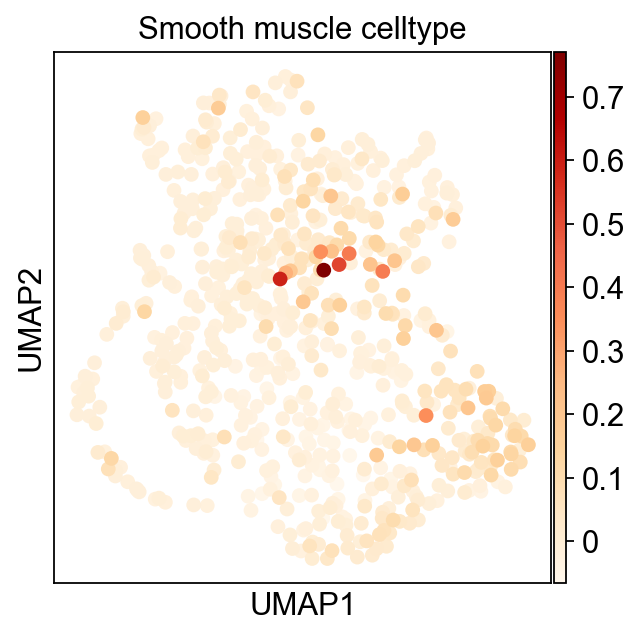

In [11]:
sc.pl.umap(adata_tfs,color='Smooth muscle_celltype')

Alternately, you can use the helper function we created at the start of this section to create an interactive plot where you can hover over the nodes to get their names. This is quite useful for quickly checking which parts of the network are exhibiting behaviour that you're interested in checking.

In [12]:
draw_corr_anno(adata_tfs, 'Embryo_organ')

You can also identify the top Pearson-correlated genes with a gene of your choice. Pick your gene and specify how many top correlated genes you want (via `N`), and take a look at their correlation values and expression profiles in the original cell space.

Nanog 1.0


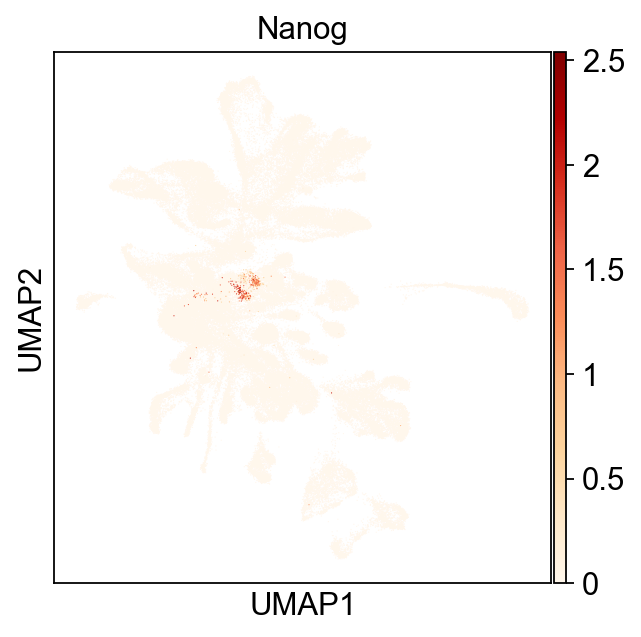

Calcoco2 0.8464052710117411


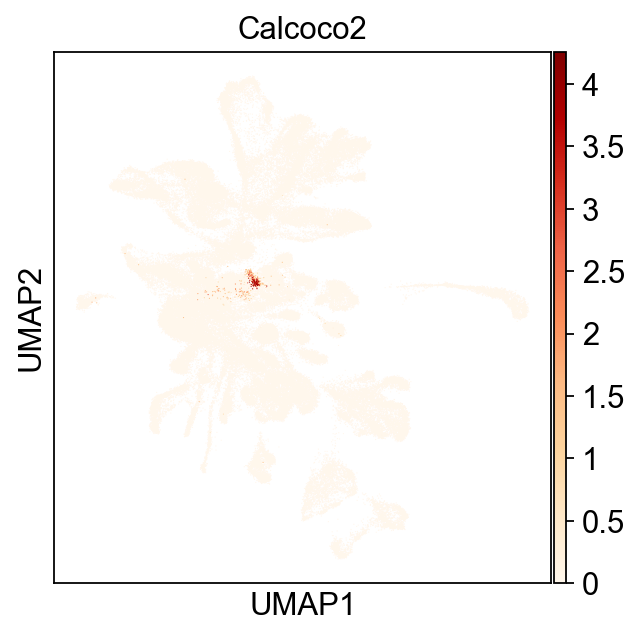

Pramel6 0.8028997168423716


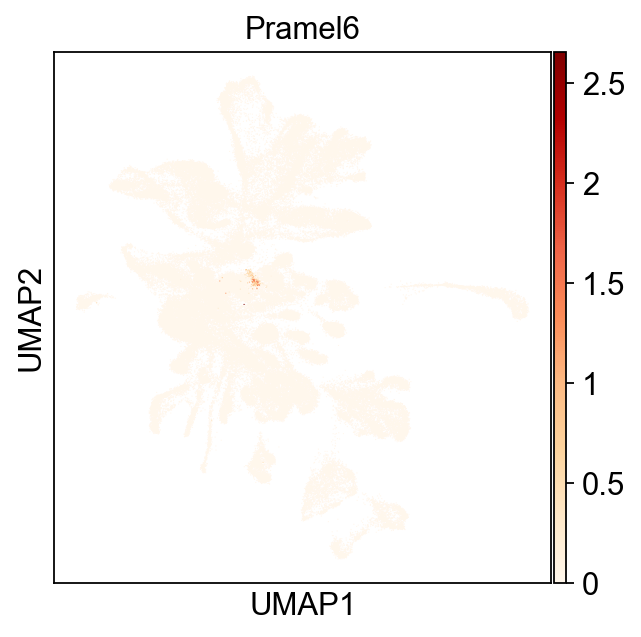

Nlrp4c 0.8012318777528301


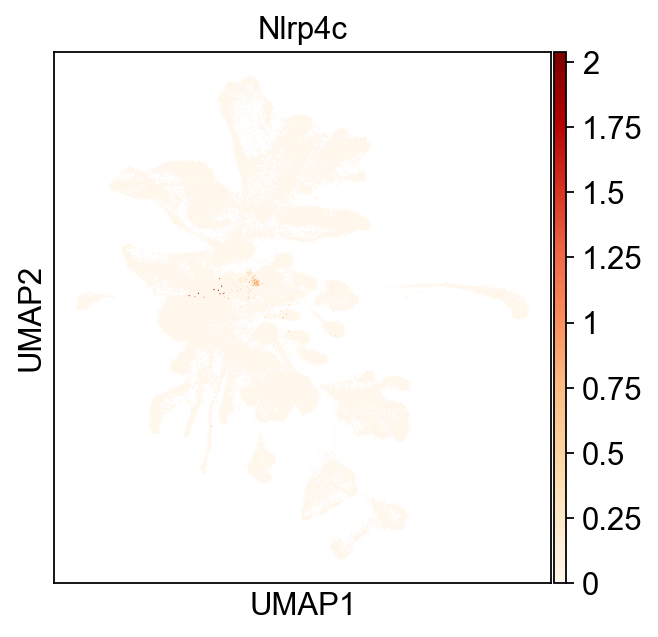

Fbxo15 0.7892487889575189


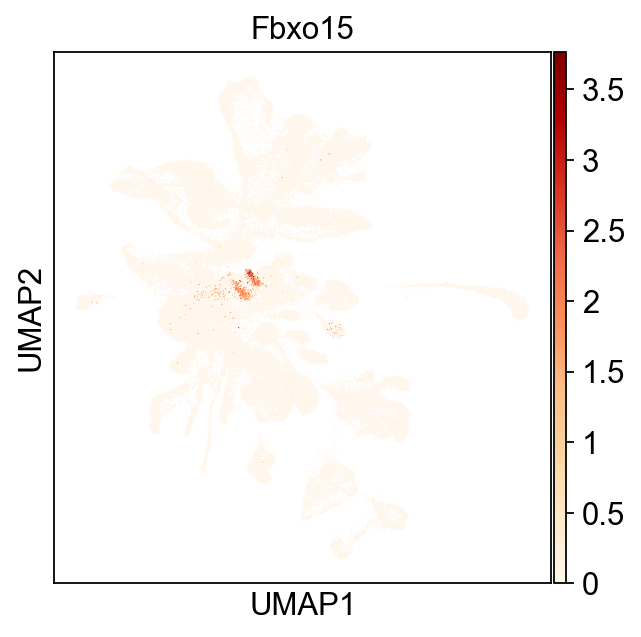

2410004A20Rik 0.7858865861710864


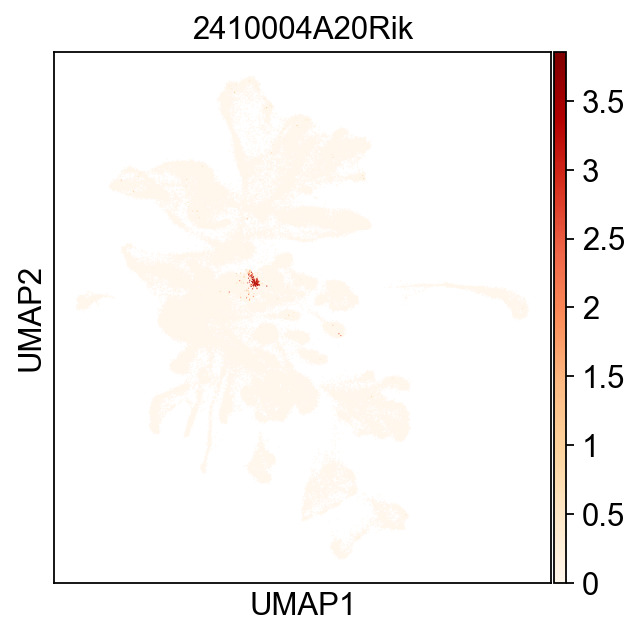

Crxos1 0.7577250657459107


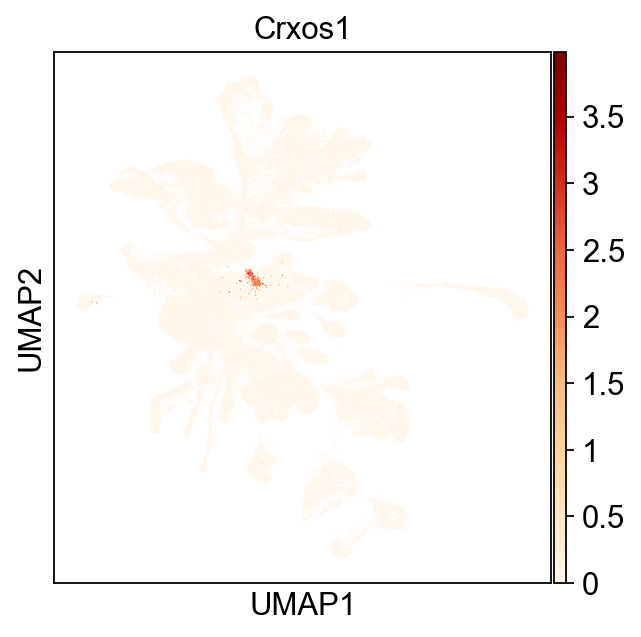

Dppa2 0.7570592554571329


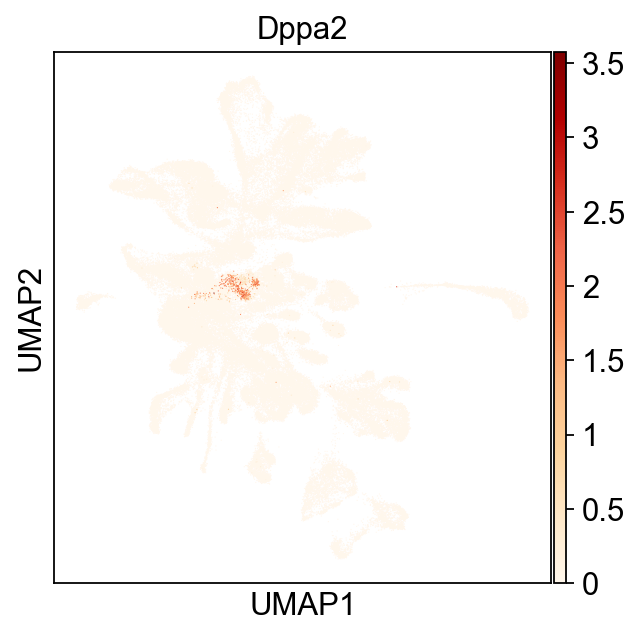

Gm15622 0.7380016805844811


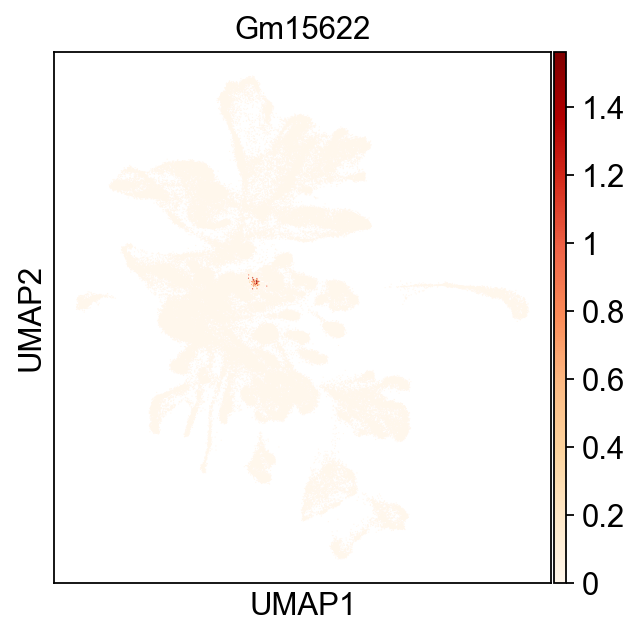

Brp44l-ps 0.7314889974854546


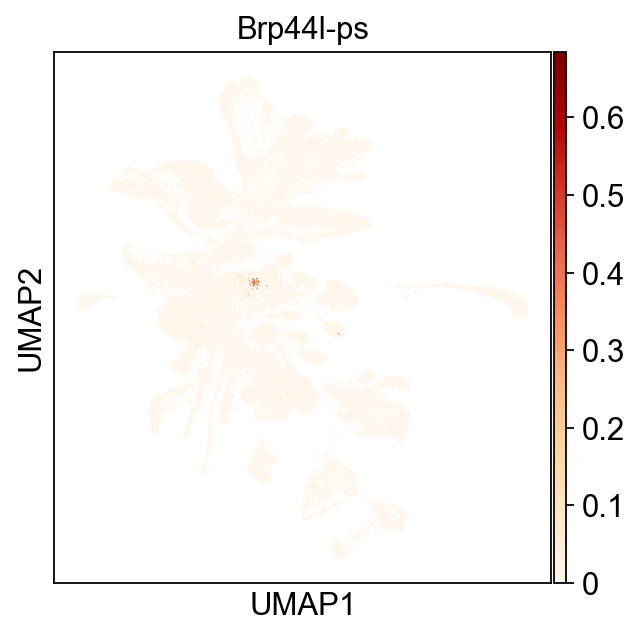

In [13]:
show_tf_module('Nanog',adata_cells,adata_tfs,N=10)